In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 922.2/922.2 kB 23.0 MB/s eta 0:00:0000:01


In [2]:
import cv2
import seaborn as sns
from ultralytics import YOLO
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import os
import subprocess
import IPython
from IPython.display import Video,display
import shutil
from tqdm import tqdm

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [3]:
model=YOLO('yolov8x.pt')
dict_classes=model.model.names

100%|██████████| 131M/131M [00:00<00:00, 356MB/s] 


In [4]:
def resize_frame(frame, scale_percent):
    width = int(frame.shape[1] * scale_percent / 100)
    height = int(frame.shape[0] * scale_percent / 100)
    dim = (width, height)
    return cv2.resize(frame, dim, interpolation=cv2.INTER_AREA)

def filter_tracks(centers, patience):
    return {k: dict(list(i.items())[-patience:]) for k, i in centers.items()}

def update_tracking(centers_old, obj_center, thr_centers, lastKey, frame, frame_max):
    is_new = 0
    lastpos = [(k, list(center.keys())[-1], list(center.values())[-1]) for k, center in centers_old.items()]
    lastpos = [(i[0], i[2]) for i in lastpos if abs(i[1] - frame) <= frame_max]
    previous_pos = [(k, obj_center) for k, centers in lastpos if (np.linalg.norm(np.array(centers) - np.array(obj_center)) < thr_centers)]
    if previous_pos:
        id_obj = previous_pos[0][0]
        centers_old[id_obj][frame] = obj_center
    else:
        id_obj = 'ID' + str(int(lastKey.split('D')[1]) + 1) if lastKey else 'ID0'
        is_new = 1
        centers_old[id_obj] = {frame: obj_center}
        lastKey = list(centers_old.keys())[-1]
    return centers_old, id_obj, is_new, lastKey


In [5]:
path='/kaggle/input/my-public-video/vid1.mp4'

In [6]:

# Configurations
path = '/kaggle/input/my-public-video/vid1.mp4'
verbose = False
scale_percent = 100
conf_level = 0.8
thr_centers = 20
frame_max = 5
patience = 100
alpha = 0.3

# Read video
video = cv2.VideoCapture(path)
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
fps = video.get(cv2.CAP_PROP_FPS)

# Define four ROI areas
roi_areas = [
    np.array([(1400, 400), (1100, 400), (1100, 1000), (1400, 1000)], np.int32),
    np.array([(400, 400), (100, 400), (100, 1000), (400, 1000)], np.int32),
    np.array([(1900, 400), (1600, 400), (1600, 1000), (1900, 1000)], np.int32),
    np.array([(900, 400), (600, 400), (600, 1000), (900, 1000)], np.int32)
]

output_path = "result.mp4"
tmp_output_path = "tmp_result.mp4"
VIDEO_CODEC = "MP4V"
output_video = cv2.VideoWriter(tmp_output_path, cv2.VideoWriter_fourcc(*VIDEO_CODEC), fps, (width, height))

centers_old = {}
lastKey = ''
roi_counts = {i: 0 for i in range(len(roi_areas))}  # Track people count for each ROI
frames_list = []

for i in tqdm(range(int(video.get(cv2.CAP_PROP_FRAME_COUNT)))):
    _, frame = video.read()
    if frame is None:
        break
    frame = resize_frame(frame, scale_percent)
    
    overlay = frame.copy()
    
    for roi_idx, roi_area in enumerate(roi_areas):
        x_min, y_min = np.min(roi_area, axis=0)
        x_max, y_max = np.max(roi_area, axis=0)
        ROI = frame[y_min:y_max, x_min:x_max]
        
        y_hat = model.predict(ROI, conf=conf_level, classes=[0], device=0, verbose=False)
        positions_frame = pd.DataFrame(
            np.column_stack([y_hat[0].boxes.xyxy.cpu().numpy(), 
                             y_hat[0].boxes.conf.cpu().numpy(), 
                             y_hat[0].boxes.cls.cpu().numpy()]),
            columns=['xmin', 'ymin', 'xmax', 'ymax', 'conf', 'class']
        )
        
        for ix, row in positions_frame.iterrows():
            xmin, ymin, xmax, ymax, confidence, category = row.astype(int)
            center_x, center_y = int((xmax + xmin) / 2), int((ymax + ymin) / 2)
            
            centers_old, id_obj, is_new, lastKey = update_tracking(
                centers_old, (center_x, center_y), thr_centers, lastKey, i, frame_max
            )
            
            if is_new:
                roi_counts[roi_idx] += 1  # Update count for the specific ROI
            
            cv2.rectangle(ROI, (xmin, ymin), (xmax, ymax), (0, 0, 255), 2)
            for cx, cy in centers_old[id_obj].values():
                cv2.circle(ROI, (cx, cy), 5, (0, 0, 255), -1)
            cv2.putText(ROI, f'{id_obj}:{str(np.round(confidence, 2))}', 
                        (xmin, ymin - 10), cv2.FONT_HERSHEY_TRIPLEX, 0.8, (0, 0, 255), 1)
        
        # Draw ROI on overlay
        cv2.polylines(overlay, [roi_area], isClosed=True, color=(0, 255, 0), thickness=2)
    
    # Display ROI counts on the frame
    for idx, roi_area in enumerate(roi_areas):
        x_min, y_min = np.min(roi_area, axis=0)
        cv2.putText(frame, f'ROI {idx+1} Count: {roi_counts[idx]}', 
                    (x_min, y_min - 10), cv2.FONT_HERSHEY_TRIPLEX, 1, (0, 255, 0), 2)
    
    frame = cv2.addWeighted(overlay, alpha, frame, 1 - alpha, 0)
    centers_old = filter_tracks(centers_old, patience)
    
    frames_list.append(frame)
    output_video.write(frame)

output_video.release()
if os.path.exists(output_path):
    os.remove(output_path)
subprocess.run(["ffmpeg", "-i", tmp_output_path, "-crf", "18", "-preset", "veryfast", "-hide_banner", "-loglevel", "error", "-vcodec", "libx264", output_path])
os.remove(tmp_output_path)

100%|██████████| 341/341 [00:51<00:00,  6.61it/s]


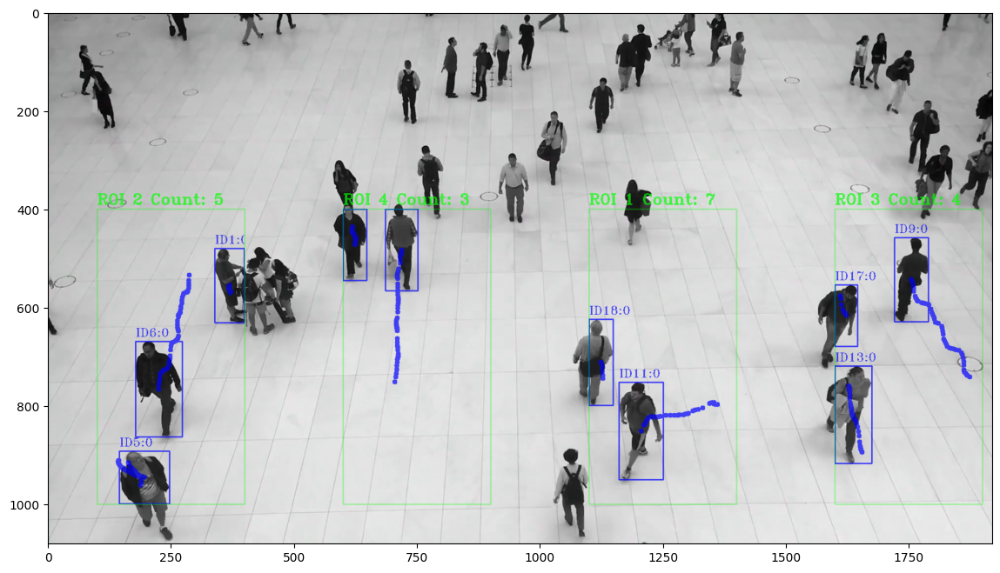

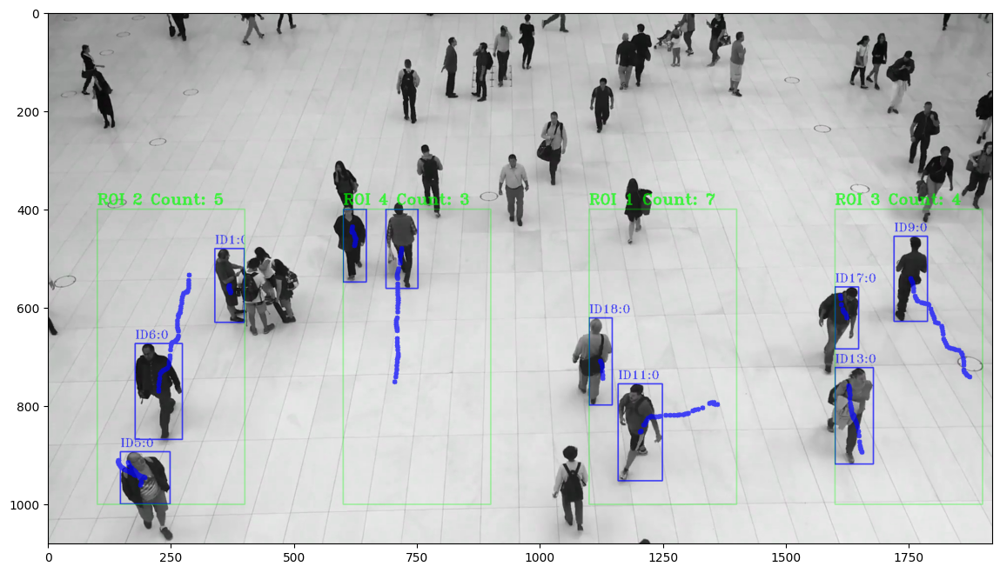

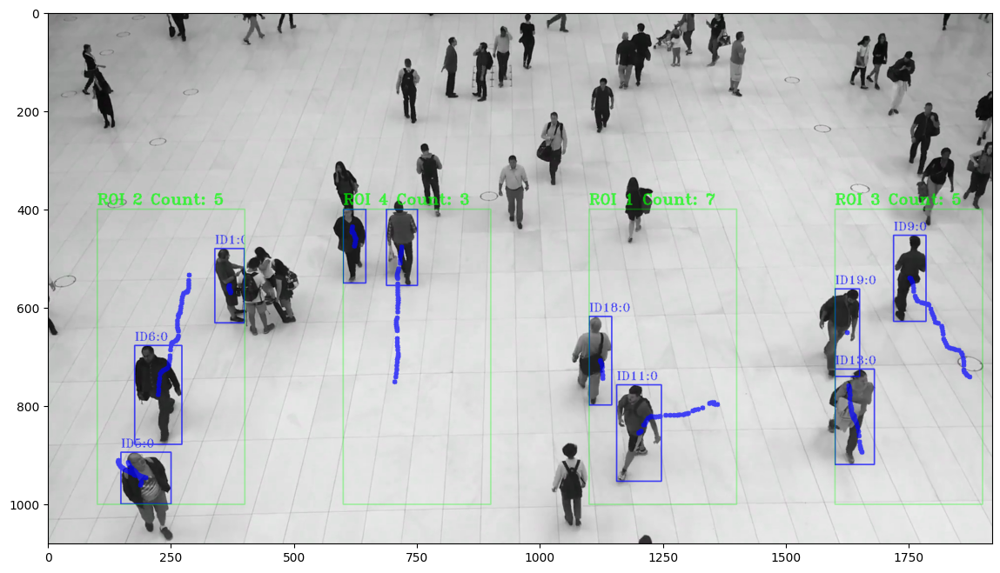

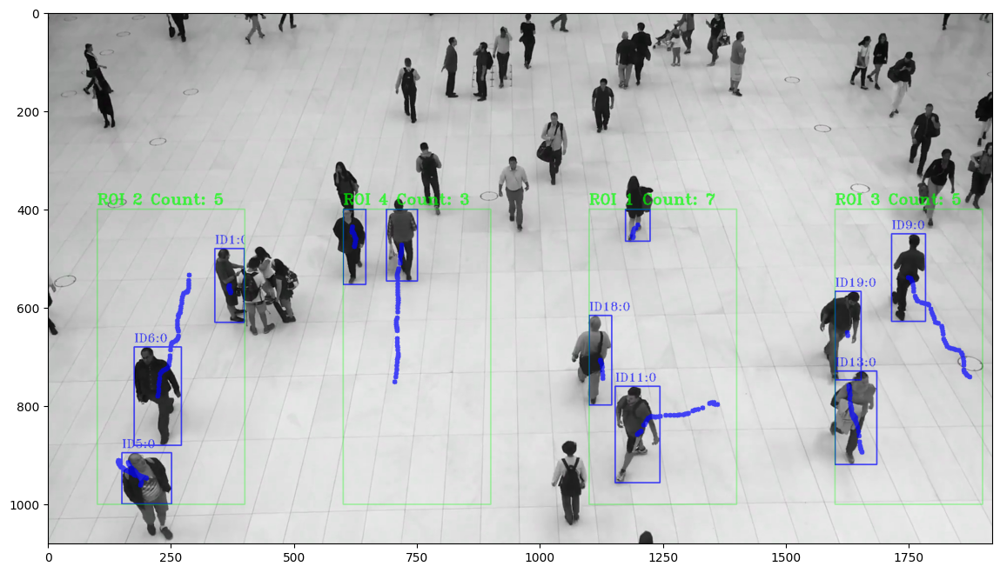

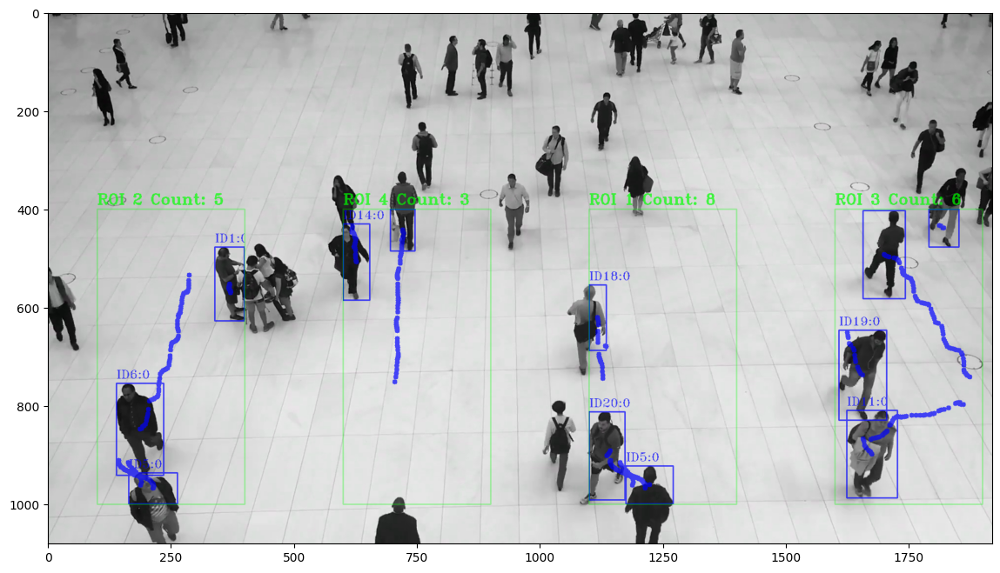

In [7]:
for i in [62,63,64,65,81]:
    plt.figure(figsize=(14,10))
    plt.imshow(frames_list[i])
    plt.show()
    

In [8]:
from IPython.display import Video

# Display the video
Video("/kaggle/working/result.mp4", embed=True)

